# Assignment - Part 1 and Part 2
### Candidate: Francesco D'Amario

## Part 1

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 1. Save the data file in your computer. I am attaching a .csv file named ^GSPC.csv. This file contains daily time series data of S&P 500 index from Dec-30, 1927 to April-7,2020.Read the data file (^GSPC.csv) into your program.

#### 2.	Read the data file (^GSPC.csv) into your program.

#### 3.	Calculate the simple return and plot the time series in a figure. Implement statistical tests to comment on the distribution of the return (i.e. whether the returns are normal, have fat-tail etc.). 
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

* Calculate the simple return and plot the time series in a figure.

In [1]:
import warnings
warnings.simplefilter(action = 'ignore', category = FutureWarning)
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
%matplotlib inline

import pandas as pd

import numpy as np
import math
import scipy

import statsmodels.api as sm

import scipy.stats as stats
from scipy.stats import shapiro
from scipy.stats import anderson
from scipy.stats import skew
from scipy.stats import kurtosis

data = pd.read_csv('C:/Users/franc/Desktop/^GSPC.csv', index_col='Date')
data = data.dropna()
data.index = pd.to_datetime(data.index, format = '%m/%d/%Y')

arr  = np.zeros([len(data),1])

for i in range(1, len(data)): arr[i] = data.values[i] / data.values[i-1] - 1

simple_returns = pd.DataFrame(index = data.index)
simple_returns = simple_returns.assign(R = arr)
simple_returns = simple_returns.iloc[1:]

print('Simple Returns - Dataframe:')
print("")
simple_returns


Simple Returns - Dataframe:



,R
Date,
1928-01-03,0.005663
1928-01-04,-0.002252
1928-01-05,-0.009594
1928-01-06,0.006268
1928-01-09,-0.009060
...,...
2020-04-01,-0.044142
2020-04-02,0.022829
2020-04-03,-0.015137


* Implement statistical tests to comment on the distribution of the return (i.e. whether the returns are normal, have fat-tail etc.).

#### Detecting outliers.


Based on the adopted method there are 373 Outliers.



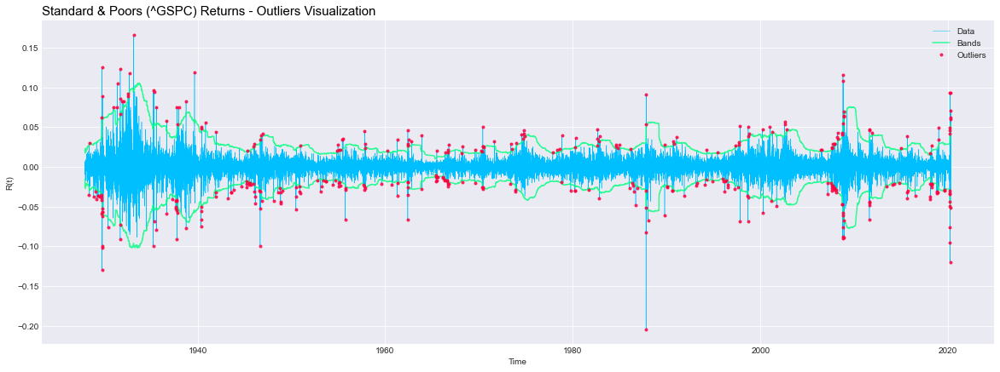

In [2]:
# Rolling Mean and Rolling Standard Devieation (Same Idea of the Bollinger Bands - I used 3 Standards Deviations) 

n      = len(simple_returns) 
array  = np.zeros([n,3], dtype = object)

rol_mu = simple_returns.rolling(347, min_periods=1).mean().values # Rolling Mean
rol_sd = simple_returns.rolling(347, min_periods=1).std().values # Rolling Std

# Bands computation
for i in range(1,n):
    array[i, 0] = rol_mu[i] + rol_sd[i] * 3 # Rolin Mean + Rolling Stds * 3
    array[i, 1] = rol_mu[i] - rol_sd[i] * 3 # Rolin Mean - Rolling Stds * 3

    if simple_returns.values[i] > array[i,0] or simple_returns.values[i] < array[i,1]: # if the returns are greater than the bands set True, False otherwise.
        array[i,2] = True

    else: 
        array[i,2] = False


outliers = array[:,2][1:n].astype(np.bool)

# Dataframe creation


print("")
print("Based on the adopted method there are {0} Outliers.".format(sum(outliers)))
print("")
bands = pd.DataFrame(index = simple_returns.index)
bands = bands.assign(R = simple_returns, Rolling_Mean = rol_mu, Rolling_Std = rol_mu, Lower = array[:,1], Upper = array[:, 0], Outliers = array[:,2])
bands = bands.iloc[1:n]

# Visualization
plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(20,7))
plt.plot(bands.index, bands['R'],'k', label='Data', lw=.5, color='#00bfff')
plt.plot(bands.index, bands['Upper'],'r-', label='Bands', alpha=0.8, color= '#00ff80')
plt.plot(bands.index, bands['Lower'],'r-', alpha=0.8, color= '#00ff80')
plt.plot(bands.index[outliers], simple_returns[1:n][outliers],'ro', label='Outliers', markersize=3, alpha=0.8, color = '#ff0040')
plt.title("Standard & Poors (^GSPC) Returns - Outliers Visualization", loc='left', fontsize=15, fontweight=0, color='#000000')
plt.xlabel("Time")
plt.ylabel("R(t)")
plt.legend()
plt.show()


#### Removing outliers 

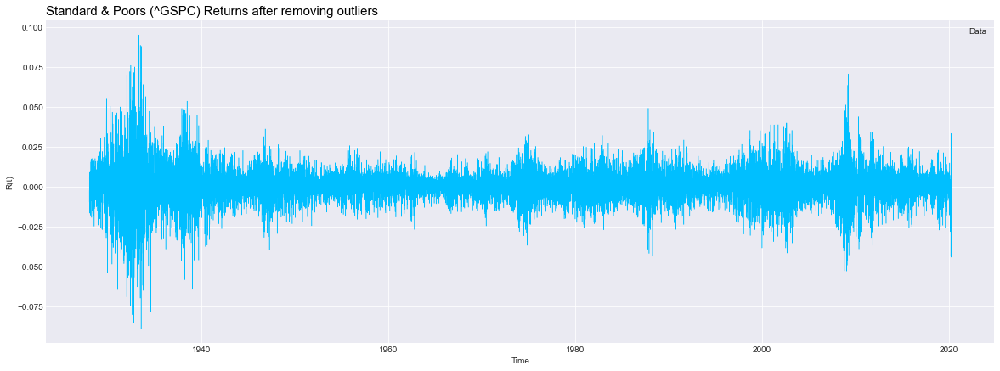

In [3]:
# Cleaning Simple Returns from Outliers
simple_returns_cleaned = pd.DataFrame(bands[bands.Outliers == False]['R'])

# Visualization
plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(20,7))
plt.plot(simple_returns_cleaned.index, simple_returns_cleaned,'k', label='Data', lw=.5, color='#00bfff')
plt.title("Standard & Poors (^GSPC) Returns after removing outliers", loc='left', fontsize=15, fontweight=0, color='#000000')
plt.xlabel("Time")
plt.ylabel("R(t)")
plt.legend()
plt.show()




#### Checking for Normality


Main Statistics:

- Mean: 0.0004
- Sigma: 0.0103
- Skwewness: -0.1145
- Kurtosis: 7.0

- Shapiro-Wilk Statistic: 0.9252 , Shapiro-Wilk p-value: 0.0
- D Angostino Statistic: 3242.7791 , D Angostino p-value: 0.0
- Kolmogorov-Smirnov Statistic 0.5379  Kolmogorov-Smirnov p-value: 0.0



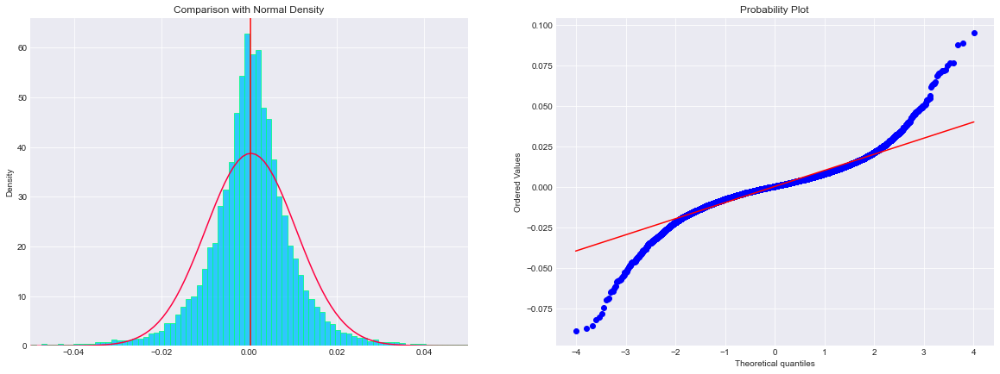

In [4]:
def normality_check(x):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x = Vector of returns                                                                                            #
    #----------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''

    n = len(simple_returns_cleaned)
    bins = int(math.sqrt(n))   
    vector = x.values

    mu    = np.round(vector.mean(), 4)
    sigma = np.round(vector.std(), 4)
    sk    = np.round(skew(vector)[0], 4)
    kurt  = np.round(kurtosis(vector)[0])

    print("Main Statistics:")
    print("")
    print("- Mean:", mu)
    print("- Sigma:", sigma)
    print("- Skwewness:", sk)
    print("- Kurtosis:", kurt)
    print("")
    print('- Shapiro-Wilk Statistic:', round(shapiro(vector)[0],4),",", 'Shapiro-Wilk p-value:', round(shapiro(vector).pvalue,4))
    print('- D Angostino Statistic:', round(stats.normaltest(vector)[0][0],4),",", 'D Angostino p-value:', round(stats.normaltest(vector).pvalue[0],4))
    print('- Kolmogorov-Smirnov Statistic', round(stats.kstest(vector, 'norm')[0],4),"", 'Kolmogorov-Smirnov p-value:', round(stats.kstest(vector, 'norm').pvalue,4))
    print("")

    plt.style.use('seaborn-darkgrid')
    fig = plt.figure(figsize=(20,7))
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.hist(x, bins = bins, density = True, facecolor = '#00bfff', edgecolor = '#00ff80', alpha=0.8)
    x = np.linspace(-0.05, 0.05, 100)
    plt.plot(x, stats.norm.pdf(x, mu, sigma), "#ff0040")
    plt.axvline(mu, color='red')
    plt.ylabel('Density')
    plt.title('Comparison with Normal Density')
    ax1.set_xlim([-0.05, 0.05])

    ax2 = fig.add_subplot(1, 2, 2)
    ax2 = stats.probplot(simple_returns_cleaned['R'], dist="norm", plot=plt)

    plt.show()

statistsics = normality_check(simple_returns_cleaned)

#### Test Comments:
* The Shapiro-Wilk test examines if a variable is normally distributed in some population. The null hypothesis for the Shapiro-Wilk test is that a variable is normally distributed in some population. With a p-value < .5 I can conclude that I reject the null hypothesis for the alternative one of Not-Normality of the distribution of returns.

* The D'Agostino-Pearson normality test computes the skewness and kurtosis to quantify how far the distribution is from Gaussian in terms of asymmetry and shape. As for the Shapiro-Wilk test, with a p-value lower than .5 we reject the null hypothesis of normality of returns.

* The Kolmogorov-Smirnov test computes a p-value from a single value: the largest discrepancy between the cumulative distribution of the data and a cumulative Gaussian distribution. Also in this case the Normality hypothesis is rejected.

#### Graphs Comments:

* The graph on the left clearly shows how the distribution of returns is Leptokurtic (Kurtosis: 7.0):Tails are longer and fatter, and central peak is higher and sharper (fat tailed). What has been said can be easily seen by looking at the graph on the left which compares the density of the Standard and Poors returns with a Normal density.

* The normal probability plot is a graphical technique for assessing whether or not a data set is approximately normally distributed. The data are plotted against a theoretical normal distribution in such a way that the points should form an approximate straight line. Departures from this straight line indicate departures from normality. The graph on the right size clearly shows that the points don't approximate a straith line. The relationship between the sample percentiles (Observed Value) and theoretical percentiles is not linear.


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 4.	From the simple return series from part (3) calculate annualized return, annualized risk and Sharpe ratio (assume risk free rate is 1.5%) and report in a table.
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [5]:
start  = simple_returns.index[0]
end    = simple_returns.index[len(simple_returns) - 1]
months = (end.year - start.year) * 12 + (end. month - start. month)

risk_free                = 0.015 
total_return             = (1+simple_returns).cumprod()['R'][len(simple_returns)-1]
annualized_return        = pow(total_return, 12 / months) - 1
annualized_risk          = np.std(simple_returns.values) * np.sqrt(252)
annualized_sharpe_ratio  = (annualized_return - risk_free) / annualized_risk

outcome = {'Annualized Return': round(annualized_return, 4), 'Annualized Risk': round(annualized_risk, 4), 'Annualized Sharpe Ratio': round(annualized_sharpe_ratio, 4)}

pd.DataFrame(outcome, index = ['^GSPC'])


,Annualized Return,Annualized Risk,Annualized Sharpe Ratio
^GSPC,0.0559,0.1903,0.2148


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 5.	Calculate max drawdown ( price level, i.e. max loss from a peak to a trough on index level over the whole period) with a time complexity of O(N).
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [6]:

def mdd(x):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x = Vector of the Returns                                                                                        # 
    #----------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''
    wealth_index = (1 + x).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdowns = (wealth_index - previous_peaks)/previous_peaks
    mdd = np.min(drawdowns).values[0]

    return mdd

print('Maximum Drawdown in percentage:', str(round(mdd(x = simple_returns),4) * 100) + '%')

Maximum Drawdown in percentage: -86.19%


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 6.	Calculate and plot in a figure the correlation between today’s SP500 index level yesterday’s index level? Is the correlation very high? Does that mean we can use yesterday’s price as a good signal to trade on SP500? If yes, could you build a strategy(e.g. long SP500 if it goes up yesterday, short if it drops yesterday)   and calculate its return? If not, what’s wrong with the correlation we calculate here?
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Coefficients:

- Pearson method: | ρ = 0.0256 | p-value = 0.0001
- Spearman method: | ρ = 0.0467 | p-value = 0.0467
- Kendal method: | ρ = 0.0329 | p-value = 0.0329



<AxesSubplot:title={'center':'Correlation between ^GSPC(t) and ^GSPC(t - 1)'}, xlabel='y(t - 1)', ylabel='y(t)'>

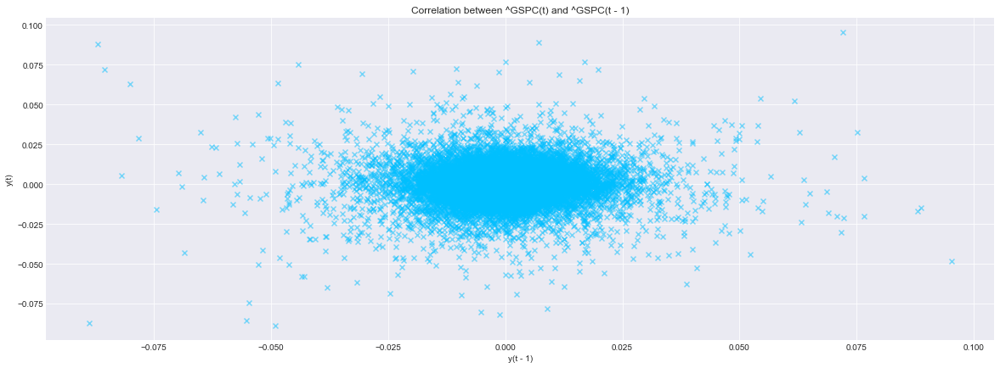

In [7]:
# Correlation coefficients
pearson  = scipy.stats.pearsonr(simple_returns_cleaned['R'][:-1], simple_returns_cleaned['R'][1:])
spearman = scipy.stats.spearmanr(simple_returns_cleaned['R'][:-1], simple_returns_cleaned['R'][1:])
kendal   = scipy.stats.kendalltau(simple_returns_cleaned['R'][:-1], simple_returns_cleaned['R'][1:])

print("Coefficients:")
print("")
print('- Pearson method:', '|', 'ρ =', round(pearson[0],4),'|', 'p-value =', round(pearson[1],4))
print('- Spearman method:', '|', 'ρ =', round(spearman[0],4),'|', 'p-value =', round(spearman[0],4))
print('- Kendal method:', '|', 'ρ =', round(kendal[0],4),'|', 'p-value =', round(kendal[0],4))
print("")

# Visualization
def LagPlot(series, lag = 1):
    
    data = series
    y1   = data[:-1] # Current value
    y2   = data[1:]
    

    plt.style.use('seaborn-darkgrid')
    ax = plt.figure(figsize=(20,7))
    ax = plt.gca()
    ax.scatter(y1, y2, c='#00bfff', alpha=0.5, marker="x")
    ax.set_xlabel("y(t - {lag})".format(lag=1))
    ax.set_ylabel("y(t)")
    plt.title("Correlation between ^GSPC(t) and ^GSPC(t - {lag})".format(lag=1))
    return ax

LagPlot(series = simple_returns_cleaned, lag = 1)


#### Coefficients Comments:
* The correlation coefficient (Pearson, Spearman, Kendal) is a measure of the strength of a linear association between two variables. In all 3 cases the values, with a p-value < .5, are approximatively close to 0 which means that there is no association between today’s SP500 index level yesterday’s index level.
#### Comments:
* A lag plot is used to evaluate whether the values in a dataset or time series are random. If the data are random, the lag plot will exhibit no identifiable pattern. If the data are not random, the lag plot will demonstrate a clearly identifiable pattern. In this case I don't see any specific pattern in the graph and so I can conclude the data data is most probably random.

-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### 7. Let’s assume y_t is the simple returns of S&P 500 index calculated in part (3). Run the following two linear regression models and report estimates and R^2-
* Model 1/ AR(1)  
 * Model 2/ AR (2) 

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### Check for Stationarity - Augmented Dickey Fuller (ADF) Test

In [8]:
def ADF_TestFunction(series):

    from statsmodels.tsa.stattools import adfuller

    data = series.values
    result = adfuller(data)
    print('')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical valuee:')
    for key, value in result[4].items():

	    print('\t%s: %.3f' % (key, value))
    
    print("")
    if result[1] <= .05:
        print('p-values < .05 -> The serie is stationary')
    else:
        print('p-values > .05 -> The serie is not stationary')

ADF_TestFunction(series = simple_returns_cleaned)


ADF Statistic: -19.529192
p-value: 0.000000
Critical valuee:
	1%: -3.431
	5%: -2.862
	10%: -2.567

p-values < .05 -> The serie is stationary


#### Create Dataframe

In [9]:
simple_returns_cleaned

,R
Date,
1928-01-04,-0.002252
1928-01-05,-0.009594
1928-01-06,0.006268
1928-01-09,-0.009060
1928-01-10,-0.007429
...,...
2020-03-31,-0.016013
2020-04-01,-0.044142
2020-04-02,0.022829


In [10]:
X = pd.DataFrame(index = simple_returns_cleaned.index[1:]) # Index of cleaned returns (Without Outliers) shifted by one value
X['Xt-1'] = simple_returns_cleaned.iloc[1:]
X['Xt-2'] = X['Xt-1'].shift(1)
# Add Costant term
X = sm.add_constant(X)
X

,const,Xt-1,Xt-2
Date,,,
1928-01-05,1.0,-0.009594,NaN
1928-01-06,1.0,0.006268,-0.009594
1928-01-09,1.0,-0.009060,0.006268
1928-01-10,1.0,-0.007429,-0.009060
1928-01-11,1.0,-0.001151,-0.007429
...,...,...,...
2020-03-31,1.0,-0.016013,0.033516
2020-04-01,1.0,-0.044142,-0.016013
2020-04-02,1.0,0.022829,-0.044142


#### AR(1) Model

In [11]:
ar1 = sm.OLS( simple_returns_cleaned.values[:-1], X.iloc[:,0:2][0:len(X)] ).fit()

print('-> AR(1):')
print('')
print('1. Parameters:')
print('')
print('β_0 =', round(ar1.params[0],5),'|', 'p-value =', round(ar1.pvalues[0],5))
print('β_1 =', round(ar1.params[1],5),'|', 'p-value =', round(ar1.pvalues[1],5))
print('')
print('2. R-squared:') 
print('')
print('Value =', round(ar1.rsquared,5))
print('')
print('--------------------------------------------------------------------------------------------------------------------------------')
print('')
ar2 = sm.OLS( simple_returns_cleaned.values[:-2], X.iloc[:,0:3][1:len(X)] ).fit()
print('-> AR(2):')
print('')
print('1. Parameters:')
print('')
print('ϕ_0 =', round(ar2.params[0],5),'|', 'p-value =', round(ar2.pvalues[0],5))
print('ϕ_1 =', round(ar2.params[1],5),'|', 'p-value =', round(ar2.pvalues[1],5))
print('ϕ_2 =', round(ar2.params[2],5),'|', 'p-value =', round(ar2.pvalues[2],5))
print('')
print('2. Adj R-squared:') 
print('')
print('Value =', round(ar2.rsquared_adj,5))
print('')

-> AR(1):

1. Parameters:

β_0 = 0.00036 | p-value = 0.0
β_1 = 0.02557 | p-value = 0.00011

2. R-squared:

Value = 0.00065

--------------------------------------------------------------------------------------------------------------------------------

-> AR(2):

1. Parameters:

ϕ_0 = 0.00037 | p-value = 0.0
ϕ_1 = -0.0074 | p-value = 0.26402
ϕ_2 = 0.02575 | p-value = 0.0001

2. Adj R-squared:

Value = 0.00062



#### Parameters Comments:

- The intercept (β_0, ϕ_1) is the expected mean value of Y when all X = 0.
- Coefficients (β_1, ϕ_1,ϕ_2): indicating a change on response variable caused by a unit change of respective explanatory variable keeping all the other explanatory variables constant.

* AR(1) - The intercept β_0 and The coefficent β_1 are both < .05 which means that are statistically significant.  
* AR(2) - The intercept β_0 and The coefficent β_2 are both < .05 which means that are statistically significant. The coefficent β_2 is greater than the confidence leve (alpha = .05) and so it's not statistically significant.

#### R-Squared:

* The coefficient of determination, r-squared, square of the correlation coefficient, is the percentage of the variance in y that can be explained by changes in x. An R-squared approximately equal to 0% indicates that the model, and so the  yesterday’s index level, doesn' explains anything of the variability of the response (today’s SP500 index level) data around its mean. what has just been said is also true for the AR (2) model which also has an R ^ 2 close to 0.






-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 8. Use t-test and give your analysis whether the parameters are statistically significant at 1% significance level. 
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [12]:
print('T-Student critical value (alpha = 1%, df = 1%):', round(stats.t.ppf(1-0.01, 2),4))
print('')
print('-> AR(1):')
print('')
print('β_0 t-value:', round(ar1.tvalues[0], 4))
print('β_1 t-value:', round(ar1.tvalues[1], 4))
print('')
print('-> AR(1):')
print('')
print('β_0 t-value:', round(ar2.tvalues[0], 4))
print('β_1 t-value:', round(ar2.tvalues[1], 4))
print('β_2 t-value:', round(ar2.tvalues[2], 4))

T-Student critical value (alpha = 1%, df = 1%): 6.9646

-> AR(1):

β_0 t-value: 5.3265
β_1 t-value: 3.8624

-> AR(1):

β_0 t-value: 5.3727
β_1 t-value: -1.117
β_2 t-value: 3.8879


#### Decision Rule: If t-statistic > Critical value than we reject the null hypothesis (H0: β/ϕ_i = 0 ) for the alternative one (H0: β/ϕ_i ≠ 0 ), the parameter is statistically significant.
-> AR(1)
- β_0 is not significant at 1% of confidence level.
- β_1 is not significant at 1% of confidence level.

-> AR(2)
- ϕ_0 is not significant at 1% of confidence level.
- ϕ_1 is not significant at 1% of confidence level.
- ϕ_2 is not significant at 1% of confidence level.


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 9. Which model between these two models (Model 1 and Model 2) is the best to use? How will you determine? 
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### There are different ways to determine wich model is the best to use such as:
1. R-squared (Single Linear Regression) and Adjusted R-squared (Multiple Linear Regression): the model that has higher R-squared is chosen. 
2. Mean Absolute Error (MAE), Mean Squared Error (MSE) and Root Mean Squared Erros RMSE)):  the model that has lower MAE/MSE/RMSE is chosen.
3. Akaike Informatio Criteria (AIC): the model that has lower AIC is chosen.
4. Forward and Backward Stepwise regression: a variable selection method where various combinations of variables are tested together. The “best” models are typically identified as those that maximize R2
, minimize AIC, or both.
5. Residual Graphical Analysis.

Conclusion: In the case of the two estimated regression models, given that previously R-squared and the adj R-squared have been extracted, a choice could be to choose the model that maximizes these last. At the same time, if I have to make a choice, I do not choose either model because I believe that neither of the two have predictive capabilities and, furthermore, the analyzes carried out previously would lead me to believe that the assumptions underlying the linear regression are not satisfied. 


#### 10.	Test whether the residuals in Model 1 and Model 2 follows normal distribution. (Note: You can use different methods. Pick your favorite and draw a conclusion based on that test.)

Main Statistics:

- Mean: -0.0
- Sigma: 0.0103
- Skwewness: -0.115
- Kurtosis: 7.0

- Shapiro-Wilk Statistic: 0.9247 , Shapiro-Wilk p-value: 0.0
- D Angostino Statistic: 3261.7812 , D Angostino p-value: 0.0
- Kolmogorov-Smirnov Statistic 0.5383  Kolmogorov-Smirnov p-value: 0.0



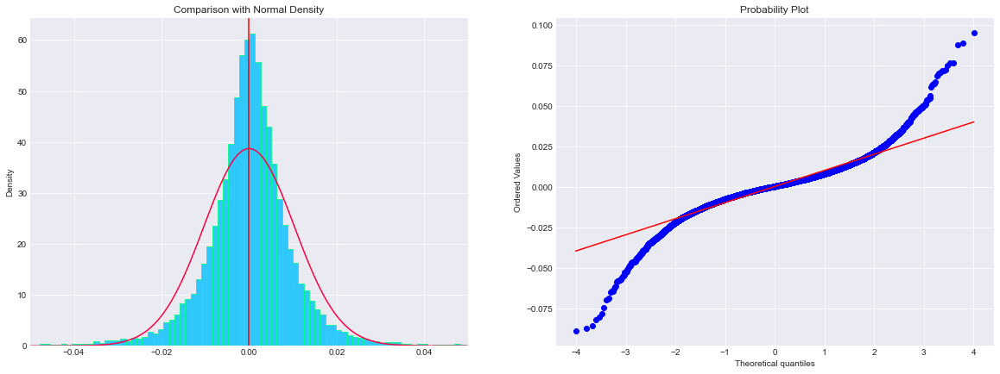

In [13]:
normality_check(pd.DataFrame(ar1.resid))

Main Statistics:

- Mean: -0.0
- Sigma: 0.0103
- Skwewness: -0.1135
- Kurtosis: 7.0

- Shapiro-Wilk Statistic: 0.9246 , Shapiro-Wilk p-value: 0.0
- D Angostino Statistic: 3264.2805 , D Angostino p-value: 0.0
- Kolmogorov-Smirnov Statistic 0.5385  Kolmogorov-Smirnov p-value: 0.0



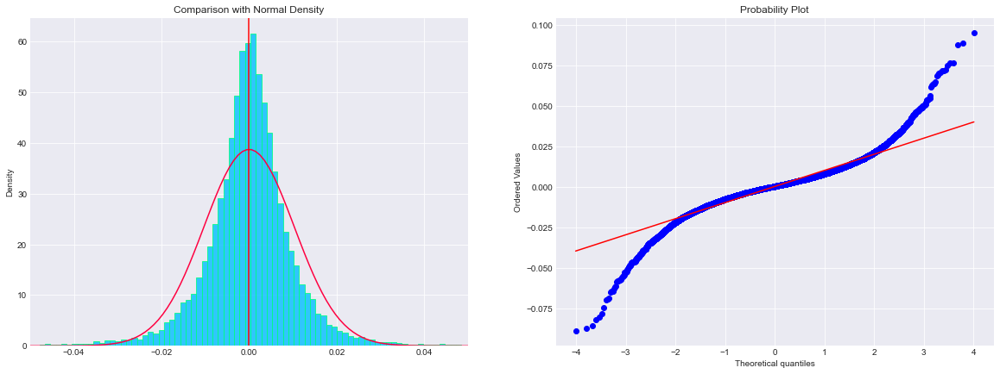

In [14]:
normality_check(pd.DataFrame(ar2.resid))

#### Conclusion:

#### Test Comments:
* Shapiro-Wilk test: p-value < .5, the residuals are Not-Normal distributed for both models, AR(1) and AR(2).

* D'Agostino-Pearson normality test: p-value < .5, the residuals are Not-Normal distributed for both models, AR(1) and AR(2).

* The Kolmogorov-Smirnov test computes a p-value from a single value: p-value < .5, the residuals are Not-Normal distributed for both models, AR(1) and AR(2).

#### Graphs Comments:

* For both models, the graph on the left compares the density of the residuals with a Normal density. We can conclude that the residuals are Not-Normal distributed, they have a Leptokurtic distribution

* For both models, the graph on the right size clearly shows that the points don't approximate a straith line. The relationship between the sample percentiles (Observed Value) and theoretical percentiles is not linear.



## Part 2

In [15]:
data1 = pd.read_csv('C:/Users/franc/Desktop/Bid_ask_g10.csv', index_col='Dates')
data1.index = pd.to_datetime(data1.index, format = '%m/%d/%Y')

# Below I adjust an abnormal value for the currency CHF (for both, bid and ask price) in the third row of the dataframe. I averaged the values before and after the outlier.
data1['PX_BID_CHF'][2] = (data1['PX_BID_CHF'][1] + data1['PX_BID_CHF'][3]) / 2
data1['PX_ASK_CHF'][2] = (data1['PX_ASK_CHF'][1] + data1['PX_ASK_CHF'][3]) / 2

data1

,PX_BID_AUD,PX_ASK_AUD,PX_BID_CAD,PX_ASK_CAD,PX_BID_CHF,PX_ASK_CHF,PX_BID_EUR,PX_ASK_EUR,PX_BID_JPY,PX_ASK_JPY,PX_BID_NOK,PX_ASK_NOK,PX_BID_NZD,PX_ASK_NZD,PX_BID_SEK,PX_ASK_SEK,PX_BID_GBP,PX_ASK_GBP
Dates,,,,,,,,,,,,,,,,,,
2000-01-03,0.6582,0.6587,1.4463,1.4473,1.5667,1.56720,1.0241,1.0245,101.53,101.45,7.8859,7.8909,0.5245,0.5255,8.3742,8.3792,1.6359,1.6364
2000-01-04,0.6547,0.6552,1.4525,1.4530,1.5568,1.55780,1.0294,1.0298,103.20,103.23,7.9444,7.9494,0.5190,0.5197,8.3785,8.3835,1.6357,1.6362
2000-01-05,0.6576,0.6581,1.4495,1.4505,1.5548,1.55575,1.0319,1.0323,104.12,104.15,7.9405,7.9455,0.5198,0.5205,8.3646,8.3696,1.6421,1.6431
2000-01-06,0.6530,0.6535,1.4594,1.4604,1.5528,1.55370,1.0325,1.0329,105.21,105.24,7.9395,7.9445,0.5142,0.5149,8.3694,8.3744,1.6471,1.6476
2000-01-07,0.6546,0.6551,1.4553,1.4563,1.5641,1.56510,1.0293,1.0298,105.32,105.36,7.9723,7.9773,0.5170,0.5180,8.4142,8.4192,1.6388,1.6398
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-24,0.6868,0.6871,1.3637,1.3639,0.9478,0.94810,1.1250,1.1252,107.03,107.05,9.6396,9.6898,0.6408,0.6411,9.3543,9.3749,1.2417,1.2421
2020-06-25,0.6886,0.6888,1.3636,1.3640,0.9484,0.94860,1.1217,1.1218,107.18,107.20,9.6520,9.6702,0.6428,0.6431,9.3034,9.3240,1.2417,1.2421
2020-06-26,0.6862,0.6868,1.3683,1.3693,0.9471,0.94840,1.1215,1.1222,107.19,107.25,9.6400,9.7557,0.6416,0.6430,9.3215,9.3517,1.2326,1.2346


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 1. Calculate spot price as the average of bid and ask price for each currency in each day. Call this spot price or bid-ask midpoint. Now use this spot price (or the bid-ask midpoint) to calculate simple return in each day for each return. Save the return file.

#### 2.	Calculate bid-ask spread as (ask price – bid price) / (ask price + Bid Price) for each currency in each day. Call this liquidity. Now save the liquidity file.
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [16]:
# Get colnames and store them into a list (Ordered).

ncols = list(range(0,data1.shape[1]))

COLNAMES = []

for i in range(0,data1.shape[1]):
    COLNAMES.append(data1.columns[i][-3:])

COLNAMES = list(dict.fromkeys(COLNAMES))
#print(colnames)

# Below I created n sublists where each of them contain two dataframes.

_list = []

for i in range(0, data1.shape[1], 2):
    
    idx = ncols[i : i+2]
    _list.append([data1.values[:,idx[0]], data1.values[:, idx[1]]])

# Below I created two empty dataframes where to store the midpoints and the bid-ask spreads calculated through function: midpoint_and_liquidity_function()

midpoint  = pd.DataFrame(columns = COLNAMES, index = data1.index)
liquidity = pd.DataFrame(columns = COLNAMES, index = data1.index)


def midpoint_and_liquidity_function(bid_price, ask_price):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. bid_price = Bid price for the currency i                                                                         #
    #: 2. ask_price = Ask price for the currency i                                                                         #
    #----------------------------------------------------------------------------------------------------------------------#
    ########################################################################################################################
    '''

    bid = bid_price
    ask = ask_price

    midpoint  = (ask + bid) * .5
    liquidity = (ask - bid) / (ask + bid)

    return midpoint, liquidity


for i,j in zip(range(0, len(COLNAMES)), COLNAMES):
    
    midpoint[j]  = midpoint_and_liquidity_function(bid_price = _list[i][0],ask_price =_list[i][1])[0]
    liquidity[j] = midpoint_and_liquidity_function(bid_price = _list[i][0],ask_price =_list[i][1])[1]

# Here I computed the simple returns 

returns = midpoint.pct_change()

# Here I removed the first row for each dataframe created

returns   = round(returns.iloc[1:len(returns)],6)
midpoint  = round(midpoint.iloc[1:len(midpoint)],6)
liquidity = round(liquidity.iloc[1:len(liquidity)],6)

In [17]:
print('Bid-Ask Midpoint - Dataframe:')
print("")
midpoint

Bid-Ask Midpoint - Dataframe:



,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,0.65495,1.45275,1.557300,1.02960,103.215,7.94690,0.51935,8.38100,1.63595
2000-01-05,0.65785,1.45000,1.555275,1.03210,104.135,7.94300,0.52015,8.36710,1.64260
2000-01-06,0.65325,1.45990,1.553250,1.03270,105.225,7.94200,0.51455,8.37190,1.64735
2000-01-07,0.65485,1.45580,1.564600,1.02955,105.340,7.97480,0.51750,8.41670,1.63930
2000-01-10,0.65605,1.45605,1.569350,1.02555,105.155,8.01340,0.51575,8.44970,1.63735
...,...,...,...,...,...,...,...,...,...
2020-06-24,0.68695,1.36380,0.947950,1.12510,107.040,9.66470,0.64095,9.36460,1.24190
2020-06-25,0.68870,1.36380,0.948500,1.12175,107.190,9.66110,0.64295,9.31370,1.24190
2020-06-26,0.68650,1.36880,0.947750,1.12185,107.220,9.69785,0.64230,9.33660,1.23360


In [18]:
print('Bid-Ask Midpoint Returns - Dataframe:')
print('')
returns

Bid-Ask Midpoint Returns - Dataframe:



,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,-0.005316,0.004113,-0.006158,0.005174,0.016997,0.007416,-0.010762,0.000513,-0.000122
2000-01-05,0.004428,-0.001893,-0.001300,0.002428,0.008913,-0.000491,0.001540,-0.001659,0.004065
2000-01-06,-0.006992,0.006828,-0.001302,0.000581,0.010467,-0.000126,-0.010766,0.000574,0.002892
2000-01-07,0.002449,-0.002808,0.007307,-0.003050,0.001093,0.004130,0.005733,0.005351,-0.004887
2000-01-10,0.001832,0.000172,0.003036,-0.003885,-0.001756,0.004840,-0.003382,0.003921,-0.001190
...,...,...,...,...,...,...,...,...,...
2020-06-24,-0.008730,0.006494,0.003281,-0.005041,0.004882,0.015514,-0.012632,0.008486,-0.008067
2020-06-25,0.002547,0.000000,0.000580,-0.002978,0.001401,-0.000372,0.003120,-0.005435,0.000000
2020-06-26,-0.003194,0.003666,-0.000791,0.000089,0.000280,0.003804,-0.001011,0.002459,-0.006683


In [19]:
print('Bid-Ask Spreads - Dataframe:')
print('')
liquidity

Bid-Ask Spreads - Dataframe:



,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,0.000382,0.000172,0.000321,0.000194,0.000145,0.000315,0.000674,0.000298,0.000153
2000-01-05,0.000380,0.000345,0.000305,0.000194,0.000144,0.000315,0.000673,0.000299,0.000304
2000-01-06,0.000383,0.000342,0.000290,0.000194,0.000143,0.000315,0.000680,0.000299,0.000152
2000-01-07,0.000382,0.000343,0.000320,0.000243,0.000190,0.000313,0.000966,0.000297,0.000305
2000-01-10,0.000381,0.000172,0.000159,0.000244,0.000143,0.000162,0.000679,0.000154,0.000153
...,...,...,...,...,...,...,...,...,...
2020-06-24,0.000218,0.000073,0.000158,0.000089,0.000093,0.002597,0.000234,0.001100,0.000161
2020-06-25,0.000145,0.000147,0.000105,0.000045,0.000093,0.000942,0.000233,0.001106,0.000161
2020-06-26,0.000437,0.000365,0.000686,0.000312,0.000280,0.005965,0.001090,0.001617,0.000811


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 3.	Use the liquidity variable or bid-ask spread (from problem #2) for each currency, first calculate a cross-sectional factor score in each day. 
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [20]:
def cross_sectional_data(dataset):
    '''
    # ############################################### METHODOLOGY USED ################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #  I defined:                                                                                                          #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. Benchmark Bid Ask Spread Benchmark as the average of all 9 Currencies ( Summ of Bid-Ask_Spread_i * 1/9).         #
    #: 2. Cross_sectional_average as the sum of all 9 Currencies divided by n-1.                                           #
    #: 3. Cross_sectional_STandard_Deviation as: SquareRoot( (Sum_i(R_i at time t) - R Benchmark at time t )^2 ) / (n-1) ) #
    #:---------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''

    data   = dataset.values
    n_cols = data.shape[1]
    # Benchmark
    bench  = data.mean(axis = 1)
    # Cross Sectional Average
    csavg  = data.sum(axis = 1) / (n_cols - 1)
    # Cross Sectional Standard Deviation
    csstd  = np.sqrt( pow(data.sum(axis=1) - bench, 2) ) / (n_cols - 1)

    return csavg, csstd

csdata = pd.DataFrame(index = liquidity.index)
csdata = csdata.assign(csavg = cross_sectional_data(liquidity)[0], csstd = cross_sectional_data(liquidity)[1])



def logistic_factor_score(x, avg, std):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x   = Bid-Ask Spread Series                                                                                      #
    #: 2. avg = Bid-Ask Spread Cross Sectional Average                                                                     #
    #: 3. std = Bid-Ask Spread Cross Sectional Standard Deviation                                                          #
    #----------------------------------------------------------------------------------------------------------------------#
    ########################################################################################################################
    '''
    vector = x.values
    csavg  = avg.values
    csstd = std.values
    # Logistic factor score of currency i
    
    factor = (vector - csavg) / csstd

    return factor 

logistic_score = pd.DataFrame(columns = COLNAMES, index = liquidity.index)


for i,j in zip(COLNAMES, COLNAMES):
    
    logistic_score[i] = logistic_factor_score(x = liquidity[j], avg = csdata['csavg'], std = csdata['csstd'])  

print('Logistic Factors Da:len(logistic_score)')

logistic_score
         

Logistic Factors Da:len(logistic_score)


,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,0.170403,-0.541729,-0.036454,-0.467125,-0.633289,-0.056801,1.160607,-0.114450,-0.606161
2000-01-05,0.030796,-0.075659,-0.197322,-0.534936,-0.687014,-0.166906,0.921975,-0.215571,-0.200363
2000-01-06,0.106951,-0.024929,-0.192191,-0.500983,-0.665029,-0.111776,1.062277,-0.163242,-0.636079
2000-01-07,-0.101481,-0.205976,-0.267602,-0.473913,-0.615920,-0.286358,1.463270,-0.329227,-0.307792
2000-01-10,0.401035,-0.436081,-0.488151,-0.147697,-0.552236,-0.476135,1.594626,-0.508178,-0.512183
...,...,...,...,...,...,...,...,...,...
2020-06-24,-0.709586,-0.985893,-0.823920,-0.955404,-0.947782,3.823761,-0.679097,0.971125,-0.818203
2020-06-25,-0.686639,-0.680593,-0.807566,-0.988957,-0.843844,1.722833,-0.420600,2.218635,-0.638268
2020-06-26,-0.784863,-0.840904,-0.591056,-0.882156,-0.907063,3.517826,-0.276604,0.133583,-0.493762


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [21]:
def cross_sectional_factor_score(x):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x  = Logistic factor score of currency i                                                                         #
    #----------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''
    vector = x.values
    arr    = (1 / (1+np.exp(-vector))) * 10

    return arr

cross_sectional_score = pd.DataFrame(columns = COLNAMES, index = logistic_score.index)

for i,j in zip(COLNAMES, COLNAMES):
    
    cross_sectional_score[i] = cross_sectional_factor_score(x = logistic_score[j]) 

print('Cross-sectional factor scores - Dataframe:')
print("")
cross_sectional_score

Cross-sectional factor scores - Dataframe:



,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,5.424980,3.677854,4.908874,3.852969,3.467651,4.858036,7.614429,4.714187,3.529355
2000-01-05,5.076984,4.810943,4.508290,3.693664,3.346976,4.583701,7.154444,4.463150,4.500761
2000-01-06,5.267124,4.937682,4.520996,3.773097,3.396109,4.720850,7.431254,4.592800,3.461333
2000-01-07,4.746515,4.486872,4.334959,3.836904,3.507100,4.288958,8.120324,4.184286,4.236537
2000-01-10,5.989362,3.926751,3.803293,4.631427,3.653457,3.831652,8.312660,3.756208,3.746819
...,...,...,...,...,...,...,...,...,...
2020-06-24,3.296903,2.717240,3.049321,2.777993,2.793311,9.786215,3.364629,7.253437,3.061451
2020-06-25,3.347811,3.361290,3.084093,2.711181,3.007257,8.484934,3.963733,9.019105,3.456381
2020-06-26,3.132727,3.013444,3.563927,2.927311,2.876011,9.711907,4.312865,5.333463,3.790076


-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
#### 4.	Now assume, your benchmark is a portfolio which assigns equal weight to each of the currency. That is each currency get 1/9 weight. Calculate the simple benchmark return using
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [22]:
benchmark_returns = pd.DataFrame(returns.sum(axis=1) * float(1/9))
benchmark_returns.columns = ['R']

print('Benchmark Returns - Dataframe')
print("")

benchmark_returns


Benchmark Returns - Dataframe



,R
Dates,
2000-01-04,0.001317
2000-01-05,0.001781
2000-01-06,0.000240
2000-01-07,0.001702
2000-01-10,0.000399
...,...
2020-06-24,0.000465
2020-06-25,-0.000126
2020-06-26,-0.000153


#### 5.	Now we will calculate portfolio weight based on the cross-sectional factor score we just derived (Note that benchmark weight of currency i is 1/9 (equal weight). Save the portfolio weights for each currency for all the time-series.).

In [23]:
def portfolio_weight(score_dataset, weight):
     '''
     # ################################################### PARAMETERS ##################################################### #
     #----------------------------------------------------------------------------------------------------------------------#
     #: 1. score_dataset = Cross-sectional factor scores - Dataframe                                                        # 
     #: 2. weight        = Benchmark weight of currency i                                                                   #
     #----------------------------------------------------------------------------------------------------------------------#
     # #################################################################################################################### #
    '''
     k           = float(weight)
     data        = score_dataset.values
     numerator   = data * k
     denominator = data.sum(axis = 1) * k

     result = pd.DataFrame(columns = COLNAMES, index = score_dataset.index)

     for i,j in zip(range(0, len(COLNAMES)), COLNAMES):

          result[j] = numerator[:, i] / denominator

     return result

weights = portfolio_weight(score_dataset = cross_sectional_score, weight = 1/9)

print('Portfolio weights - Dataframe')
print("")

weights


Portfolio weights - Dataframe



,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,0.129018,0.087467,0.116744,0.091632,0.082468,0.115535,0.181088,0.112114,0.083936
2000-01-05,0.120482,0.114169,0.106986,0.087654,0.079427,0.108776,0.169782,0.105915,0.106808
2000-01-06,0.125106,0.117281,0.107384,0.089620,0.080665,0.112131,0.176509,0.109089,0.082215
2000-01-07,0.113710,0.107489,0.103850,0.091919,0.084018,0.102748,0.194534,0.100241,0.101492
2000-01-10,0.143797,0.094276,0.091312,0.111194,0.087715,0.091993,0.199576,0.090182,0.089956
...,...,...,...,...,...,...,...,...,...
2020-06-24,0.086532,0.071318,0.080034,0.072912,0.073314,0.256853,0.088309,0.190376,0.080352
2020-06-25,0.082793,0.083127,0.076271,0.067049,0.074371,0.209837,0.098025,0.223048,0.085478
2020-06-26,0.081029,0.077944,0.092182,0.075716,0.074389,0.251202,0.111554,0.137952,0.098032


#### 6.	Now calculate portfolio returns at each period (day) by taking the product sum of portfolio weight from problem #5 and simple return from problem #1. Call it simple portfolio return.

In [24]:
# Portfolio Returns

simple_portfolio_returns         = np.multiply(weights,returns).sum(axis = 1)
simple_portfolio_returns         = pd.DataFrame(simple_portfolio_returns)
simple_portfolio_returns.columns = ['R']

print('Portfolio returns - Dataframe:')
print("")
simple_portfolio_returns

Portfolio returns - Dataframe:



,R
Dates,
2000-01-04,-0.000214
2000-01-05,0.001566
2000-01-06,-0.000931
2000-01-07,0.002127
2000-01-10,-0.000012
...,...
2020-06-24,0.003797
2020-06-25,-0.000825
2020-06-26,0.000508


#### 7.	Now from the simple portfolio return in problem #6, calculate annualized return, annualized risk, information ratio and maximum drawdown. Now using benchmark return from problem # 4, calculate the active return (annualized), active risk (annualized) and active information ratio. Report all of these numbers in a table and comment in your own word.   

In [25]:
# Portolio and Benchmark Variance

returns

,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
Dates,,,,,,,,,
2000-01-04,-0.005316,0.004113,-0.006158,0.005174,0.016997,0.007416,-0.010762,0.000513,-0.000122
2000-01-05,0.004428,-0.001893,-0.001300,0.002428,0.008913,-0.000491,0.001540,-0.001659,0.004065
2000-01-06,-0.006992,0.006828,-0.001302,0.000581,0.010467,-0.000126,-0.010766,0.000574,0.002892
2000-01-07,0.002449,-0.002808,0.007307,-0.003050,0.001093,0.004130,0.005733,0.005351,-0.004887
2000-01-10,0.001832,0.000172,0.003036,-0.003885,-0.001756,0.004840,-0.003382,0.003921,-0.001190
...,...,...,...,...,...,...,...,...,...
2020-06-24,-0.008730,0.006494,0.003281,-0.005041,0.004882,0.015514,-0.012632,0.008486,-0.008067
2020-06-25,0.002547,0.000000,0.000580,-0.002978,0.001401,-0.000372,0.003120,-0.005435,0.000000
2020-06-26,-0.003194,0.003666,-0.000791,0.000089,0.000280,0.003804,-0.001011,0.002459,-0.006683


In [26]:
pd.options.display.float_format = '{:.10f}'.format
var_cov_matrix = returns.cov()*252*100

def highlight_diag(var_cov_matrix):

    a = np.full(var_cov_matrix.shape, '', dtype='<U24')
    np.fill_diagonal(a, 'background-color: yellow')
    return pd.DataFrame(a, index=var_cov_matrix.index, columns=var_cov_matrix.columns)

var_cov_matrix = var_cov_matrix.style.apply(highlight_diag, axis=None)
var_cov_matrix

,AUD,CAD,CHF,EUR,JPY,NOK,NZD,SEK,GBP
AUD,1.560984,-0.703428,-0.499457,0.655686,-0.043798,-0.896168,1.302132,-0.869430,0.579516
CAD,-0.703428,0.775001,0.280951,-0.380647,-0.004406,0.568463,-0.643835,0.527204,-0.349719
CHF,-0.499457,0.280951,1.200818,-0.790034,0.418020,0.750081,-0.516297,0.764071,-0.476471
EUR,0.655686,-0.380647,-0.790034,0.921674,-0.268913,-0.879802,0.646420,-0.916370,0.546179
JPY,-0.043798,-0.004406,0.418020,-0.268913,0.961570,0.177131,-0.097902,0.188650,-0.146972
NOK,-0.896168,0.568463,0.750081,-0.879802,0.177131,1.466192,-0.853432,1.125810,-0.634775
NZD,1.302132,-0.643835,-0.516297,0.646420,-0.097902,-0.853432,1.608129,-0.832999,0.575266
SEK,-0.869430,0.527204,0.764071,-0.916370,0.188650,1.125810,-0.832999,1.387383,-0.617228
GBP,0.579516,-0.349719,-0.476471,0.546179,-0.146972,-0.634775,0.575266,-0.617228,0.846398


In [27]:
def annualized_return(x):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x = Vector of the returns                                                                                        # 
    #----------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''
    start  = x.index[0] # Start Date
    end    = x.index[len(x) - 1] # End Date
    months = (end.year - start.year) * 12 + (end. month - start. month) # Total Months in the whole period

    total_return      = (1+x).cumprod()['R'][len(x)-1]
    annualized_return = pow(total_return, 12 / months) - 1
    return annualized_return

def annualized_portfolio_risk(x, weights_vector):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x              = Returns dataframe for alla stocks                                                               # 
    #: 2. weights_vector = weights' vector of currency i                                                                   #
    #----------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''
    np.set_printoptions(suppress=True)
    vcov_matrix   = x.cov().values * 252
    portfolio_std = np.sqrt(np.dot(weights_vector.T, np.dot(vcov_matrix, weights_vector)))

    return portfolio_std

def maximum_drawdown(x):
    '''
    # ################################################### PARAMETERS ##################################################### #
    #----------------------------------------------------------------------------------------------------------------------#
    #: 1. x = Vector of the Returns                                                                                        # 
    #----------------------------------------------------------------------------------------------------------------------#
    # #################################################################################################################### #
    '''
    wealth_index = (1 + x).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdowns = (wealth_index - previous_peaks)/previous_peaks
    mdd = np.min(drawdowns).values[0]

    return mdd

annualized_return_benchmark = annualized_return(x = benchmark_returns)
annualized_risk_benchmark   = annualized_portfolio_risk( x = returns, weights_vector = np.full(shape= len(COLNAMES), fill_value=1/9, dtype=np.float) ) # weights: 1/9 for each currency
mdd_benchmark               = maximum_drawdown(x = benchmark_returns)

print('Benchmark:')
print('----------')
print('-> Annualized Benchmark Return in percentage:', str( np.round(annualized_return_benchmark,5) * 100) + '%')
print('-> Annualized Benchmark Risk in percentage:', str( np.round( annualized_risk_benchmark, 4) * 100) + '%') 
print('-> Maximum Benchmark Drawdown (MDD) in percentage:', str( np.round(mdd_benchmark,3) * 100) + '%')
print('')

annualized_return_portfolio = annualized_return(x = simple_portfolio_returns)
annualized_risk_portfolio   = annualized_portfolio_risk( x = returns, weights_vector = weights.mean(axis = 0).values) # NB - The portfolio weights are computed as the average of daily weights for each currency
mdd_portfolio               = maximum_drawdown(x = simple_portfolio_returns)

print('Portfolio:')
print('----------')
print('-> Annualized Portfolio Return in percentage:', str( np.round(annualized_return_portfolio,5) * 100) + '%')
# NB Sum of Weights of the Portfolio id to make sure that the sum of weights of the Portfolio is 1.
print('-> Annualized Portfolio Risk in percentage:', str( np.round( annualized_risk_portfolio, 4) * 100) + '%','|', 'Sum of Weights of the Portfolio =', np.round(sum(weights.mean(axis = 0).values),2))
print('-> Maximum Portfolio Drawdown (MDD) in percentage:', str( np.round(mdd_portfolio,5) * 100) + '%')
# Annualized Active Return: difference between Annualized Portfolio Return and Annualized Benchmark Return
annualized_active_return = annualized_return_portfolio - annualized_return_benchmark
print('-> Annualized Active Return in percentage:', str( np.round(annualized_active_return,5) * 100) + '%')
# Annualized Active Risk: difference between Annualized Portfolio Std and Annualized Benchmark Std
annualized_active_risk   = annualized_risk_portfolio - annualized_risk_benchmark
print('-> Annualized Active Risk in percentage:', str( np.round(annualized_active_risk,4) * 100) + '%')
# Active Information Ratio
active_informatio_ratio = annualized_active_return / annualized_active_risk
print('-> Active Information Ratio in percentage:', str( np.round(active_informatio_ratio,4) * 100) + '%')


Benchmark:
----------
-> Annualized Benchmark Return in percentage: 0.512%
-> Annualized Benchmark Risk in percentage: 2.74%
-> Maximum Benchmark Drawdown (MDD) in percentage: -9.0%

Portfolio:
----------
-> Annualized Portfolio Return in percentage: 0.695%
-> Annualized Portfolio Risk in percentage: 3.16% | Sum of Weights of the Portfolio = 1.0
-> Maximum Portfolio Drawdown (MDD) in percentage: -10.34%
-> Annualized Active Return in percentage: 0.183%
-> Annualized Active Risk in percentage: 0.42%
-> Active Information Ratio in percentage: 43.74%


#### Comments:

1. Annualized Active Return: Also known as excess return, active return refers to the portion of an investment's gain or loss that can be attributed to the decisions made by an active portfolio manager. In our case it can be concluded that the portfolio manager with the choice of the weights assigned to the individual currencies in the portfolio was able to generate, on an annual basis, an excess return compared to the benchmark equal to 0.695%

2. Annualized Active Risk in percentage: Active Risk is a type of risk that an active portfolio manager creates as it attempts to beat the returns of the benchmark against which it is compared. In our case, in order to achieve an extra return on an annual basis of 0.695%, the manager has assumed on an annual basis a risk that is 0.42% higher than the risk of the benchmark. 

3. Active Informatio Ratio: Information ratio shows the consistency of the fund manager in generating superior risk adjusted performance. A higher information ratio shows that fund manager has outshined other fund managers and has delivered consistent returns over a specified period. In our case, the excess return generated on an annual basis is equal to 43.74% of the Annualized Active Risk.

